# Response time minimization - South-West police district

### Version 4.0

- Goal: Minimize the response time of police vehicles to events within police district.
- The problem is formulated as a capacitated vehicle positioning problem using PuLP.


#### South-West police district
South-West police district covers from 1 January 2020 23 municipalities in Rogaland, five municipalities in Vestland and one in Agder county. The police district stretched from Moi and Lund municipality in the south, to Bømlo and Fitjar in the north, and with the municipalities of Suldal and Sirdal in the east.

In [1]:
# import watermark
%reload_ext watermark
%watermark

Last updated: 2024-04-13T20:45:42.991623+02:00

Python implementation: CPython
Python version       : 3.11.6
IPython version      : 8.22.2

Compiler    : MSC v.1935 64 bit (AMD64)
OS          : Windows
Release     : 10
Machine     : AMD64
Processor   : Intel64 Family 6 Model 158 Stepping 10, GenuineIntel
CPU cores   : 12
Architecture: 64bit



In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import shapely
from shapely.geometry import Point, LineString, Polygon, MultiPolygon, mapping
from shapely.ops import nearest_points, unary_union
from descartes import PolygonPatch
import pyproj
import geopandas as gpd
import osmnx as ox
import networkx as nx
import pandana as pdna
import pulp
import highspy
import folium
import utilityModule # own custom functions

pd.set_option('display.float_format', lambda x: '%.3f' % x)
ox.settings.log_console=True
ox.settings.use_cache=True
%watermark -w
%watermark -iv

Watermark: 2.4.3

numpy     : 1.26.4
osmnx     : 1.9.1
pandana   : 0.7
matplotlib: 3.8.3
shapely   : 2.0.3
pandas    : 2.2.1
folium    : 0.16.0
geopandas : 0.14.3
pulp      : 2.8.0
networkx  : 3.2.1
highspy   : 1.5.3
pyproj    : 3.6.1



## 0. Load road network

We load a road network of Oslo police district that has been preprocessed.
- Network type: drive
- CRS: WGS84 EPSG:4326, will be converted to UTM33N EPSG:32633
- Network already contains edge weights (travel time in seconds)
- Node centrality measures has already been calculated for the network and stored as a CSV file.

In [3]:
### Load road network file of Øst police district, Norway
# Read from local path
SouthWest_filepath = "../data/SouthWest/SouthWestExtDriveImputed.graphml" # with travel time attribute
SouthWest_graph = ox.load_graphml(SouthWest_filepath) # originally in WGS84 (EPSG:4326)

Type of SouthWest_graph: <class 'networkx.classes.multidigraph.MultiDiGraph'>
CRS of SouthWest_graph:  EPSG:32633


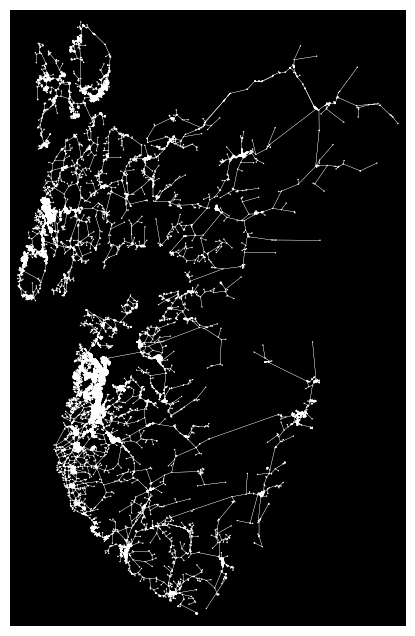

In [4]:
SouthWest_graph = ox.projection.project_graph(SouthWest_graph, to_crs='EPSG:32633') # if need to project to UTM zone 33N
print(f"Type of SouthWest_graph: {type(SouthWest_graph)}")
print(f"CRS of SouthWest_graph:  {SouthWest_graph.graph['crs']}")

# plot graph
fig, ax = ox.plot_graph(SouthWest_graph, node_size=1, edge_linewidth=0.2, edge_color="w", bgcolor="k")

Convert graph to GeoDataFrame and plot it.   
`osmnx.utils_graph.graph_to_gdfs(G, nodes=True, edges=True, node_geometry=True, fill_edge_geometry=True)` - Convert a MultiDiGraph to node and/or edge GeoDataFrames.

In [5]:
# converting the graph network to node and edge GeoPandas GeoDataFrames
nodes, edges = ox.graph_to_gdfs(SouthWest_graph, nodes=True, edges=True)
print(f"type of nodes:{type(nodes)}")
# nodes.head()
edges.head(2) # verify edges contain speed and travel time

type of nodes:<class 'geopandas.geodataframe.GeoDataFrame'>


osmid   ref           name    highway maxspeed  \
u        v          key                                                       
60894741 676852078  0     53581260  4276      Mongveien  secondary       80   
         6498309502 0    692276023    44  Sokndalsveien    primary       80   

                         oneway reversed   length  speed_kph  travel_time  \
u        v          key                                                     
60894741 676852078  0     False    False 1798.083     80.000       80.900   
         6498309502 0     False    False 1271.272     80.000       57.200   

                        bridge lanes tunnel access junction width est_width  \
u        v          key                                                       
60894741 676852078  0      NaN   NaN    NaN    NaN      NaN   NaN       NaN   
         6498309502 0      NaN   NaN    NaN    NaN      NaN   NaN       NaN   

                        area service  \
u        v          key                
60894741 676852078  0    NaN     NaN   
         6498309502 0    NaN     NaN   

                                                                  geometry  
u        v          key                                                     
60894741 676852078  0    LINESTRING (-18787.259 6505430.688, -19515.356...  
         6498309502 0    LINESTRING (-18787.259 6505430.688, -19628.050...

In [6]:
nodes.head(2) # verify nodes contain x and y coordinates

,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
60894741,6505430.688,-18787.259,3,6.113,58.380,NaN,NaN,POINT (-18787.259 6505430.688)
676852078,6503977.475,-19515.356,1,6.104,58.367,NaN,NaN,POINT (-19515.356 6503977.475)


In [7]:
# print number of nodes and edges
print(f"Number of nodes: {len(nodes)}")
print(f"Number of edges: {len(edges)}")

Number of nodes: 36574
Number of edges: 77888


## 1. Simulate event points

Steps:  
1.1 Load preprocessed population data  
1.2 Event simulation based purely on population count. Should fall in range [2000,2500]  
1.3 Snap points to network (after defined Pandana network)  

### 1.1 Load preprocessed population data  

We load preprocessed population data in 250x250m grid cells from SSB - Oslo police district.
- Correct extent: Combined municipalities of  Asker, Bærum and Oslo.
- CRS: WGS84 EPSG:4326, will be converted to UTM33N EPSG:32633 before analysis.

In [8]:
# load preprocessed polygon data and convert to CRS UTM zone 33N (EPSG:32633)
SouthWest_polygon_path = "../data/SouthWest/SouthWestCombinedPolygon.geojson"
SouthWest_polygon_gdf = gpd.read_file(SouthWest_polygon_path)
SouthWest_polygon_gdf = SouthWest_polygon_gdf.to_crs(SouthWest_graph.graph['crs']) # convert to same CRS as the road network

In [9]:
# load preprocessed population data and convert to CRS UTM zone 33N (EPSG:32633)
population_path = "../data/SouthWest/SouthWestPopulation.geojson"
population_gdf = gpd.read_file(population_path)
population_gdf = population_gdf.to_crs(SouthWest_graph.graph['crs']) # convert to same CRS as the road network

In [10]:
print(f"type of pop_df: {type(population_gdf)}")
print(f"columns of population_gdf: {population_gdf.columns}")
population_gdf.head(2)

type of pop_df: <class 'geopandas.geodataframe.GeoDataFrame'>
columns of population_gdf: Index(['id', 'population', 'geometry'], dtype='object')


,id,population,geometry
0,19955006492000,2,"POLYGON ((-4499.991 6492249.995, -4249.991 649..."
1,19955006492000,2,"POLYGON ((-4499.991 6492249.995, -4249.991 649..."


### 1.2 Event simulation based on population counts

For each gridcell, simulated events are generated based on the population count and scaled with a self-adjustable factor that ensure the total number of simulated events will fall in the preferred range of [2000,2500].

In [11]:
# calculate the number of points to simulate in each grid cell - vectorized version
simulated_events_dict = utilityModule.simulate_event_points(population_gdf, pop_std_multiplier=0.006172363281250001, min_range=1500, max_range=1550)
population_gdf = simulated_events_dict["population_gdf"]

Total number of simulated event points: 1540. Target range [1500, 1550], using population multiplier: 0.00409375
 Correction factor: 0.006172363281250001/0.00409375 = 1.50775286259542


In [12]:
# print the number of cells with 0, 1, 2, ..., 9 events
for i in range(0, 7):
    print(f"Nr of cells with {i} events: {len(population_gdf[population_gdf['num_points'] == i])}")

# print the cells with the highest number of points
population_gdf.nlargest(3, 'num_points')

Nr of cells with 0 events: 14708
Nr of cells with 1 events: 1353
Nr of cells with 2 events: 86
Nr of cells with 3 events: 5
Nr of cells with 4 events: 0
Nr of cells with 5 events: 0
Nr of cells with 6 events: 0


,id,population,geometry,num_points
7050,19685006573000,619,"POLYGON ((-31499.982 6572999.992, -31499.982 6...",3
7058,19695006572750,706,"POLYGON ((-30499.983 6572749.992, -30499.983 6...",3
7075,19687506573250,637,"POLYGON ((-31249.982 6573249.992, -31249.982 6...",3


In [13]:
%%time
# List to hold all generated points
event_points = []
# Iterate over rows in your GeoDataFrame
for _, row in population_gdf.iterrows():
    # Extract number of points to generate for the current row
    num_points = row['num_points']
    if num_points > 0:  # Proceed only if there are points to generate
        # Generate points within the grid cell 
        points = utilityModule.generate_points_within_gridcell(num_points, row['geometry'].bounds)
        event_points.extend(points)

# Create a GeoDataFrame from the generated points
event_points_gdf = gpd.GeoDataFrame(geometry=event_points, crs=population_gdf.crs)
event_points_gdf.head(3)

CPU times: total: 625 ms
Wall time: 1.07 s


,geometry
0,POINT (-9422.138 6500378.137)
1,POINT (-24429.017 6512411.309)
2,POINT (-24428.996 6512620.168)


In [14]:
# print number of nodes
print(f"Number of nodes: {len(nodes)}")

Number of nodes: 36574


In [22]:
# print(f"Number of nodes: {len(nodes)}")
high_pop_density_area = utilityModule.generate_high_density_polygon(event_points_gdf, grid_size=100, density_threshold=2.0e-11, simplification_tolerance=5.0, plot_results=False)

Density: Min: 3.842e-43 | Median: 9.888e-13 | Mean: 7.243e-11 | Max: 2.582e-09


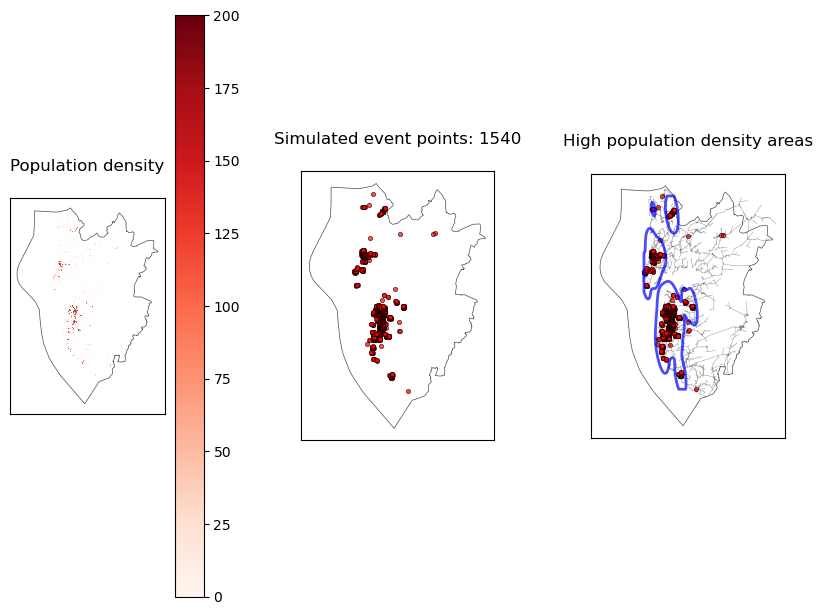

In [23]:
# Plot the population density, simulated event points, and high population density areas side-by-side
utilityModule.plot_population_density_and_event_points(SouthWest_polygon_gdf, population_gdf, event_points_gdf, high_pop_density_area, edges)

*(Skip using this kernel density function to constrain the sampling of car nodes)*

Function show stability issues for several districts.

## 2. Police car candidate points

Steps:  
2.1 Add Centrality measure as node attribute  
2.2 Sample candidate points and filter out poor candidate points

In [24]:
nodes.head(2)

,y,x,street_count,lon,lat,highway,ref,geometry
osmid,,,,,,,,
60894741,6505430.688,-18787.259,3,6.113,58.380,NaN,NaN,POINT (-18787.259 6505430.688)
676852078,6503977.475,-19515.356,1,6.104,58.367,NaN,NaN,POINT (-19515.356 6503977.475)


### 2.1 Add Centrality measure as node attribute

Next we load the pre-computed closeness centrality and add it as an attribute to the nodes GeoDataFrame.  

*Closeness centrality is a measure of how close a node is to all other nodes in the network.   
It is calculated as the reciprocal of the sum of the shortest path distances from the node to all other nodes in the graph.*

In [25]:
# import node closeness centrality from file
# if centrality is in the nodes GeoDataFrame, drop it
if 'closeness_centrality' in nodes.columns:
    nodes.drop(columns=['closeness_centrality'], inplace=True)
if 'betweenness_centrality' in nodes.columns:
    nodes.drop(columns=['betweenness_centrality'], inplace=True)

nodes_centrality_import = pd.read_csv("../data/SouthWest/SouthWestNodeCentrality.csv")

In [26]:
# Now use the merge function. Since 'osmid' is the index in `nodes`, we can merge on the index
nodes = nodes.merge(nodes_centrality_import, left_index=True, right_on='osmid')
print(f"Number of nodes: {len(nodes)}")
nodes.head(2)


Number of nodes: 36574


,y,x,street_count,lon,lat,highway,ref,geometry,osmid,closeness_centrality,betweenness_centrality
0,6505430.688,-18787.259,3,6.113,58.380,NaN,NaN,POINT (-18787.259 6505430.688),60894741,0.000,2374003.000
1,6503977.475,-19515.356,1,6.104,58.367,NaN,NaN,POINT (-19515.356 6503977.475),676852078,0.000,0.000


In [27]:
# After the merge, if you want 'osmid' as a column instead of an index, you can reset the index
nodes.reset_index(drop=True, inplace=True)
nodes.set_index('osmid', inplace=True)
nodes.head(2)

,y,x,street_count,lon,lat,highway,ref,geometry,closeness_centrality,betweenness_centrality
osmid,,,,,,,,,,
60894741,6505430.688,-18787.259,3,6.113,58.380,NaN,NaN,POINT (-18787.259 6505430.688),0.000,2374003.000
676852078,6503977.475,-19515.356,1,6.104,58.367,NaN,NaN,POINT (-19515.356 6503977.475),0.000,0.000


Now, that the closeness centrality is added as an attribute to the ``nodes`` GeoDataFrame, we can use this to filter out better candidate locations for the police cars.

In [28]:
# # inspect stats for columns closeness_centrality and betweenness_centrality
# print(f"Stats for closeness_centrality:\n{nodes['closeness_centrality'].describe()}")
# print(f"Stats for betweenness_centrality:\n{nodes['betweenness_centrality'].describe()}")


### 2.2 Sample candidate points and filter out poor candidate points

#### Steps:
1. Sample a set of random points from the road network (using the high population density areas as a polygon).
2. Filter out points that are too close to the border of the road network (closeness centrality threshold).
3. Filter out points that are too close to each other.
4. Filter out points that are too close to the existing police stations.

In [29]:
# random nodes from the graph
SEED = 2
NR_OF_CAR_NODES = 200

# sample X random source nodes from the area high_pop_density_area
# car_nodes = nodes[nodes.within(high_pop_density_area.geometry.values[0])]
car_nodes = nodes.copy()
car_nodes = car_nodes.sample(NR_OF_CAR_NODES, random_state=SEED, replace=False)
print(f"Total nr of nodes: {len(nodes)}, nr of police car nodes: {len(car_nodes)}")

# make car_nodes into a GeoDataFrame
car_nodes_gdf = gpd.GeoDataFrame(car_nodes, geometry=gpd.points_from_xy(car_nodes.x, car_nodes.y))
car_nodes.head(2)

Total nr of nodes: 36574, nr of police car nodes: 200


,y,x,street_count,lon,lat,highway,ref,geometry,closeness_centrality,betweenness_centrality
osmid,,,,,,,,,,
265761476,6563350.047,-33647.385,3,5.726,58.876,NaN,NaN,POINT (-33647.385 6563350.047),0.001,439227.000
420331461,6558614.537,-34186.274,3,5.728,58.833,NaN,NaN,POINT (-34186.274 6558614.537),0.001,98108.000


Input nr of car nodes: 200
Remaining nr of car nodes: 160, after discarding the 40 (20%) remote car nodes with lowest closeness centrality
Centrality Measure: closeness


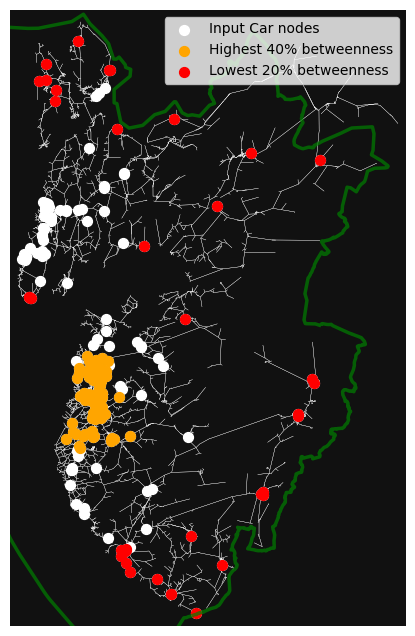

In [30]:
car_nodes_gdf_central1 = utilityModule.filter_by_centrality(geo_df=car_nodes_gdf, district_boundary=SouthWest_polygon_gdf, 
                            top_percent=0.4, bottom_percent=0.20, input_graph=SouthWest_graph, centrality_measure="closeness", plot=True)

Input nr of car nodes: 160
Remaining nr of car nodes: 96, after discarding the 64 (40%) remote car nodes with lowest betweenness centrality
Centrality Measure: betweenness


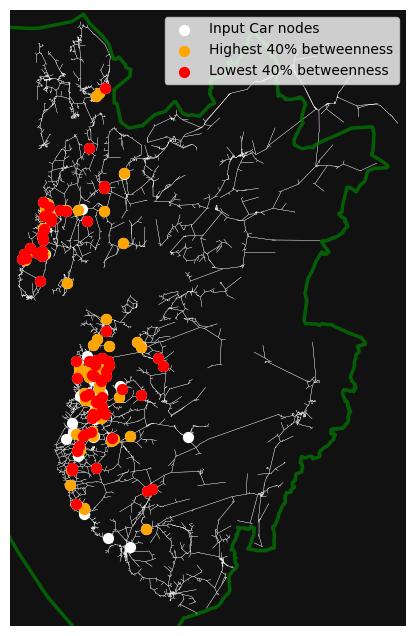

In [31]:
car_nodes_gdf_central2 = utilityModule.filter_by_centrality(geo_df=car_nodes_gdf_central1, district_boundary=SouthWest_polygon_gdf, top_percent=0.4, bottom_percent=0.40, 
                                                            input_graph=SouthWest_graph, centrality_measure="betweenness", plot=True)

Input nr of car nodes: 96
Remaining nr of car nodes: 25, after removing the 71 nodes that are within 6000 m of each other



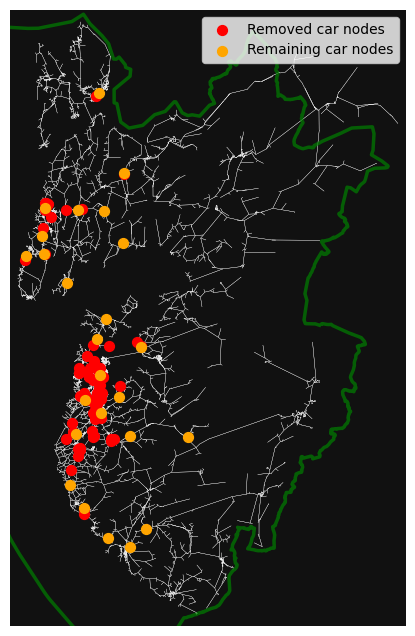

In [32]:
car_nodes_gdf_filtered = utilityModule.filter_nodes_by_proximity(geo_df=car_nodes_gdf_central2, district_boundary=SouthWest_polygon_gdf, 
                        min_distance=6000, input_graph=SouthWest_graph, criterion_col='betweenness_centrality', prefer='higher', plot=True)

## 3. Define the Pandana network

Now we use the GeoDataFrames from `osmnx` to create a `pandana` network.

Pandana networks is defined like this:   
`pandana.network.Network(node_x, node_y, edge_from, edge_to, edge_weights, twoway=True)`  

 **edge_weights**: DataFrame, all numerics   
- Specifies one or more impedances on the network which define the distances between nodes.  
- Multiple impedances can be used to capture travel times at different times of day, for instance.

We will use both ``length`` and ``travel_time`` as edge weights. However, we must specify which one to use when querying the network (cannot calculate with both at the same time).

In [33]:
# reset index so our origins and destinations are not in index
edges = edges.reset_index()
# nodes = nodes.reset_index()

# create network with pandana
SouthWest_network_pdna = pdna.Network(node_x=nodes['x'], node_y=nodes['y'], edge_from=edges['u'], edge_to=edges['v'], 
                                      edge_weights=edges[["length", "travel_time"]], twoway=True)

# Print stats about the network
print(f"type of SouthWest_network_pdna: {type(SouthWest_network_pdna)}")
print(f"Network nodes:")
SouthWest_network_pdna.nodes_df.head(2)

type of SouthWest_network_pdna: <class 'pandana.network.Network'>
Network nodes:


,x,y
osmid,,
60894741,-18787.259,6505430.688
676852078,-19515.356,6503977.475


In [34]:
print(f"Network edges: ")
SouthWest_network_pdna.edges_df.head(2)

Network edges: 


,from,to,length,travel_time
0,60894741,676852078,1798.083,80.900
1,60894741,6498309502,1271.272,57.200


In [35]:
# %%time
# SouthWest_network_pdna.precompute(3000)

Recall that the Car Nodes were directly sampled from the road network, while event points were generated outside the road network. Therefore, we need to snap the event points to the Pandana network.

In [36]:
# identify nearest node to each event point
event_points_gdf['nearest_node'] = SouthWest_network_pdna.get_node_ids(event_points_gdf.geometry.x, event_points_gdf.geometry.y, mapping_distance=1000)

# With nearest_node attribute, find osm x,y coordinates
event_points_gdf = event_points_gdf.merge(nodes[['x', 'y']], left_on='nearest_node', right_index=True, suffixes=('', '_nearest_node'))
event_points_gdf.head(2)

,geometry,nearest_node,x,y
0,POINT (-9422.138 6500378.137),2530722751,-9419.288,6500382.789
1,POINT (-24429.017 6512411.309),2177366103,-24433.309,6512370.637


In [37]:
# Get list of nearest node ids for event locations
event_nodes_pdna = SouthWest_network_pdna.get_node_ids(x_col=event_points_gdf.geometry.x, y_col=event_points_gdf.geometry.y).values
event_nodes_pdna[:5]

# get the nearest node ids (in this case, just selecting the 'osmid')
car_nodes_pdna = SouthWest_network_pdna.get_node_ids(x_col=car_nodes_gdf_filtered.x, y_col=car_nodes_gdf_filtered.y).values
car_nodes_pdna[:5]

array([6515865614, 7399052546,  268376204, 7304182329, 2031514084],
      dtype=int64)

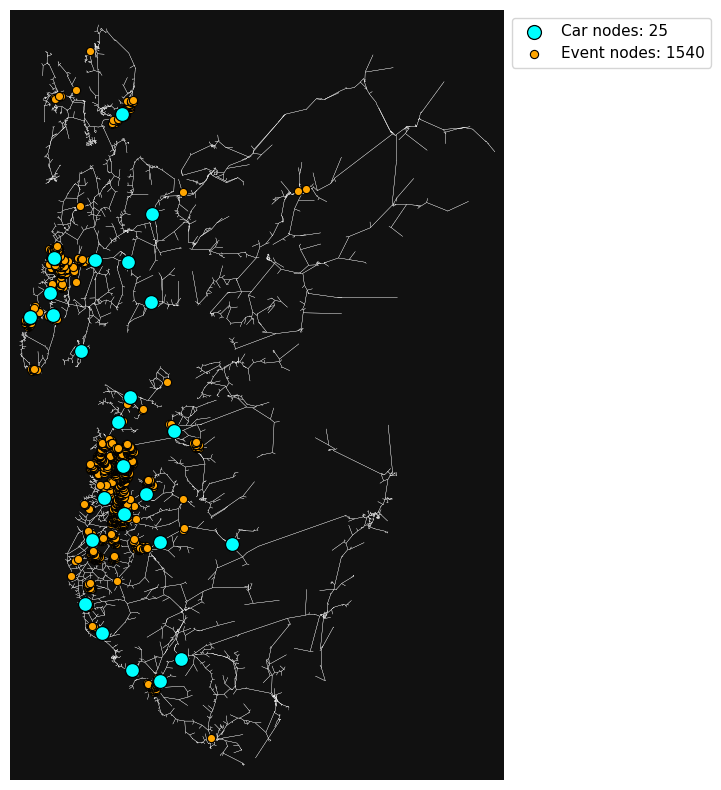

In [38]:
# Plot overview of Car nodes and Event nodes
fig, ax = ox.plot_graph(SouthWest_graph, node_color="white", node_size=0, edge_linewidth=0.2, edge_color="w", show=False, close=False, figsize=(10,10))
ax.scatter(car_nodes_gdf_filtered['x'], car_nodes_gdf_filtered['y'], c='cyan', edgecolor='black', lw=0.90, s=100, label=f"Car nodes: {len(car_nodes_gdf_filtered)}", zorder=3)
ax.scatter(event_points_gdf['x'], event_points_gdf['y'], c='orange', s=35, edgecolor='black', lw=0.80, label=f"Event nodes: {len(event_points_gdf)}", zorder=2)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=11)
plt.show()

## 4. Cost Matrix - Calculate all origin-destination pairs

First, identify the nearest node to each Police car and Event.
- [network.get_node_ids()](http://udst.github.io/pandana/network.html#pandana.network.Network.get_node_ids)

In [39]:
# Creating origins-destination pairs
origins = np.repeat(car_nodes_pdna, len(event_nodes_pdna))
destinations = np.tile(event_nodes_pdna, len(car_nodes_pdna))

In [40]:
%%time
# distance between each possible pair of facilities-clients combination
distances = SouthWest_network_pdna.shortest_path_lengths(origins, destinations, imp_name='length')
travel_times = SouthWest_network_pdna.shortest_path_lengths(origins, destinations, imp_name='travel_time')

print(type(travel_times))
print("Number of travel_times calculated: ", len(travel_times))
print("5 first origin-destination distances [m]     :", distances[:5])
print("5 first origin-destination travel times [sec]:", travel_times[:5])

<class 'list'>
Number of travel_times calculated:  38500
5 first origin-destination distances [m]     : [33023.637, 13214.823, 12919.052, 12807.271, 12466.025]
5 first origin-destination travel times [sec]: [1657.0, 821.5, 795.6, 795.9, 760.2]
CPU times: total: 2.38 s
Wall time: 287 ms


c:\ProgramData\miniconda3\envs\MCLP_env\Lib\site-packages\pandana\network.py:334: UserWarning: Unsigned integer: shortest path distance is trying to be calculated                 between the following external unconnected nodes: [(6515865614, 5838121745), (6515865614, 7399055534), (6515865614, 7399058412), (6515865614, 7399056754), (6515865614, 7399057673), (6515865614, 7399054018), (6515865614, 7399052243), (6515865614, 7399057573), (6515865614, 7399058014), (6515865614, 7399049794), (6515865614, 7399058479), (6515865614, 7399057431), (6515865614, 7399054727), (6515865614, 2491767691), (6515865614, 7399055387), (6515865614, 7399053186), (6515865614, 7399054682), (6515865614, 7399050608), (6515865614, 7399052336), (6515865614, 7399053886), (6515865614, 7399053747), (6515865614, 7399057781), (6515865614, 7399058304), (6515865614, 7399054838), (6515865614, 7399053908), (6515865614, 7399055492), (6515865614, 7399054708), (6515865614, 7399053644), (6515865614, 7399053828), (6515865614, 739

In [41]:
# print the statistics for distances and travel times
# print("Distances statistics:")
# print(pd.Series(distances).describe())
print("\nTravel times statistics:")
print(pd.Series(travel_times).describe())


Travel times statistics:
count     38500.000
mean    1889191.950
std     2130834.295
min           8.500
25%        1562.100
50%        3351.850
75%     4294967.295
max     4294967.295
dtype: float64


In [42]:
# Restructure the distances and travel times arrays into a DataFrame (CSouthWest Matrix) and add the car and event node ids as columns

# create a DataFrame from the distances and travel times arrays
CostMatrix = pd.DataFrame({'distance': distances, 'travel_time': travel_times})

# add the car and event node ids as columns
CostMatrix['carNodeID'] = np.repeat(car_nodes_pdna, len(event_nodes_pdna))
CostMatrix['eventNodeID'] = np.tile(event_nodes_pdna, len(car_nodes_pdna))
CostMatrix.head() # distances, travel times, car and event node ids

# merge the distances DataFrame with the car and event nodes DataFrames to get the coordinates
CostMatrix_extended = CostMatrix.merge(nodes[['x', 'y']], left_on='carNodeID', right_index=True, suffixes=('', '_car'))
CostMatrix_extended = CostMatrix.merge(nodes[['x', 'y']], left_on='eventNodeID', right_index=True, suffixes=('', '_event'))
CostMatrix.head(2)

,distance,travel_time,carNodeID,eventNodeID
0,33023.637,1657.000,6515865614,2530722751
1,13214.823,821.500,6515865614,2177366103


In [43]:
CostMatrix_extended.head(2) # distances, travel times, car and event node coordinates

,distance,travel_time,carNodeID,eventNodeID,x,y
0,33023.637,1657.000,6515865614,2530722751,-9419.288,6500382.789
1,13214.823,821.500,6515865614,2177366103,-24433.309,6512370.637


In [44]:
# Save cSouthWest matrix to CSV
CostMatrix.to_csv("../data/SouthWest/SouthWestCostMatrix.csv", index=False)

# # import cSouthWest matrix from CSV
# CostMatrix_imported = pd.read_csv("../data/SouthWest/SouthWestCostMatrix.csv")
# CostMatrix_imported.head(2)

CostMatrix.drop(columns="distance", inplace=True)

Now, we have made Cost Matrices with distances and travel times between each police car and event node pair.
- ``CostMatrix`` is the lean cost matrix that will be used for further computations in optimization problems. - *saved as local .csv file for later use*
- ``CostMatrix_extended`` is the cost matrix extended with coordinate information. Useful for post-optimization tasks.

# 5. Optimization problem

### 5.1 Formulating the problem
We will use the Python library PuLP to model and solve the optimization problem.   
The objective is to minimize the total response time to events, by optimally positioning a fixed number of police cars.

### Notation

Let's define the notation that will be used to formulate the problem:
- $N$ : The set of all nodes in the road network.
- $E$ : The set of events, each associated with a node in $N$ and a severity score.
- $P$ : The set of potential police car locations, a subset of $N$.
- $C_{ij}$ : The travel time from police car location $i \in P$ to event location $j \in E$.
- $x_i$ : Binary decision variable where $x_i = 1$ if a police car is positioned at node $i$, and $x_i = 0$ otherwise.
- $y_{ij}$ : Binary decision variable where $y_{ij} = 1$ if the event $j$ is assigned to the police car located at $i$, and $y_{ij} = 0$ otherwise.

### Objective Function
The objective is to minimize the total response time to all events. The response time is the travel time from a police car to an event, considering only the assignments where $y_{ij} = 1$.
$$
\text{Minimize} \quad Z = \sum_{i \in P} C_{ij} \cdot y_{ij}
$$

### Constraints
1. **Police Car Placement Constraint**: Only $K$ police cars are available to be deployed.
$$
\sum_{i \in P} x_i = K
$$

2. **Event Assignment Constraint**: Each event must be assigned to exactly one police car.
$$
\sum_{i \in P} y_{ij} = 1 \quad \forall j \in E
$$

3. **Validity Constraint**: An event can only be assigned to a police car if that car is positioned at a node.
$$
y_{ij} \leq x_i \quad \forall i \in P, \forall j \in E
$$

4. **Capacity Constraint**: Each police car can only be assigned to a limited number of events.
$$
\sum_{j \in E} y_{ij} \leq M_i \cdot x_i \quad \forall i \in P
$$

5. **Non-Negativity and Integrality**: Ensure that the decision variables are binary.
$$
x_i \in \{0, 1\} \quad \forall i \in P
$$
$$
y_{ij} \in \{0, 1\} \quad \forall i \in P, \forall j \in E
$$


### 5.2 Preprocessing data structures for efficient computation

In [45]:
%%time
# find the total number of unique events from the reduced cSouthWest matrix
nr_of_unique_events = CostMatrix['eventNodeID'].nunique()
print(f"Total number of unique events: {nr_of_unique_events}")

# Preprocess the cSouthWest matrix
# 1) Convert to a dictionary for fast lookup
# 2) Reduce problem size: Remove top x% travel times, as there is probably a closer car to the event
DISCARD_THRESHOLD = 0.40
CostMatrix_dict_reduced = utilityModule.preprocess_cost_matrix(CostMatrix, discard_threshold=DISCARD_THRESHOLD, verbose=True)

Total number of unique events: 1511
Filtering out 40% highest travel times - keeping only travel times <= 4294967 sec, or 71582.8 min
Original nr of pairs: 37775 | Filtered nr of pairs: 37775
Original max travel time: 4294967.295 | Filtered max travel time: 4294967.295
Original min travel time: 8.5 | Filtered min travel time: 8.5
CPU times: total: 93.8 ms
Wall time: 83.3 ms


### 5.2 Setup LP problem

In [46]:
# Constants
NR_OF_CARS = 4
CAR_CAPACITY = 450

# # Sets
P = CostMatrix['carNodeID'].unique()  # Potential police car locations
E = CostMatrix['eventNodeID'].unique()  # Events

# Define PuLP problem
problem = utilityModule.define_pulp_problem(CostMatrix, CostMatrix_dict_reduced, 
    nr_of_cars=NR_OF_CARS, car_capacity=CAR_CAPACITY, problem_name="PoliceCarLocationOptimization", verbose=True)

Number of police car locations: 25
Number of events: 1511


Number of decision variables: 37800
Number of constraints: 39312
Number of non-zero coefficients: 37800
Number of non-zero coefficients in the objective function: 37775
PuLP Problem setup took 2.17 seconds


### 5.5 Run the solvers

- **PULP_CBC (COIN-OR Branch and Cut)** - open-source solver that is included in the PuLP package.
- **HiGHS (High-Performance Solver)** - a high-performance solver that use the HiGHS optimization engine.

1st run of each solver will relax the integer variable constraint (`mip=False`) for fast computation. 2nd run of each solver will use proper integer constraints (`mip=True`) to get the slow, final solution for verification.

*Recall this is a minimization problem, so the lower the objective value, the better the solution.*

In [47]:
# Inspect available pulp solvers
pulp.listSolvers(onlyAvailable=True)

['GLPK_CMD', 'PULP_CBC_CMD', 'COIN_CMD', 'HiGHS']

PULP_CBC_CMD with LP relaxation found 3/4 locations in 3.89 seconds.
Switching to MILP solver configuration to find optimal solution.



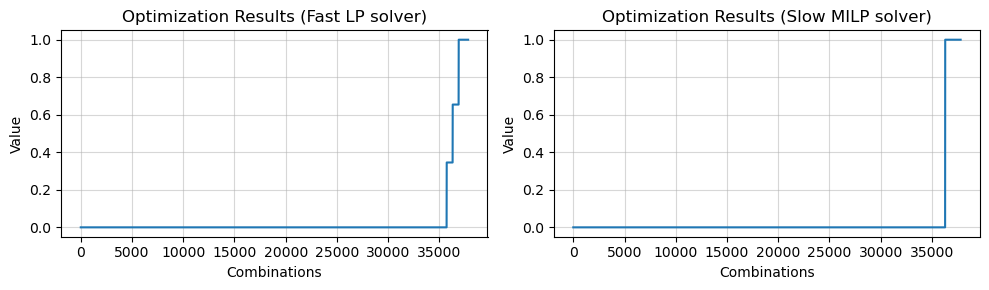

Optimal police car locations found: 4/4 in 75.53 seconds: [2031514084  676743089  278220245 7538835582]
Solver: PULP_CBC_CMD | Status: 1 (Optimal)
Objective function value (total response time): 1017016.7740 seconds, or 16950.28 minutes, or 282.50 hours
(Note: Currently reducing the Cost matrix by 40%)
CPU times: total: 5.89 s
Wall time: 1min 25s


In [48]:
%%time
# Run the solver
solve = utilityModule.run_solvers(problem, P, nr_of_locations=4, 
                                solver_name='PULP_CBC_CMD', forceMIP=False, plot=False)
print(f"(Note: Currently reducing the Cost matrix by {DISCARD_THRESHOLD*100:.0f}%)")

### 5.6 Extract results for inspection

In [49]:
# Extract optimal police car locations
optimal_locations = {i: problem.variablesDict()[f"x_{i}"].varValue for i in P if problem.variablesDict()[f"x_{i}"].varValue == 1}
print("Optimal police car locations:", optimal_locations.keys())

# convert to geodataframe for plotting. Should contain the carNodeID and the geometry (Point)
optimal_locations_gdf = gpd.GeoDataFrame(geometry=[Point(nodes.loc[node, 'x'], nodes.loc[node, 'y']) for node in optimal_locations.keys()], crs="EPSG:32633")
optimal_locations_gdf['carNodeID'] = optimal_locations.keys()
carNodeID_list = list(optimal_locations_gdf['carNodeID'])

car_to_events_df = utilityModule.create_car_to_events_df(CostMatrix_extended, optimal_locations, problem, 
                                                         CAR_CAPACITY, nr_of_unique_events, verbose=True)

Optimal police car locations: dict_keys([2031514084, 676743089, 278220245, 7538835582])
Car 2031514084 is assigned 450/450 events
Car 676743089 is assigned 303/450 events
Car 278220245 is assigned 450/450 events
Car 7538835582 is assigned 308/450 events
Summing the events for each car gives 1511 events, which should equal the total number of unique events: 1511


## 6. Visualization

### 6.1 Plot the optimal police car locations and events

Input parameters:
- Possible police car locations: 25 | Optimal locations in solution: 4
- Events: 1511 | Max event capacity per police car: 450

Solution from Linear Programming (LP) model:
Goal: minimize objective function (total response time)
Objective function value: 1017017 sec | 16950.3 min | 282.50 hours

Car id: 2031514084 handles 450 events | Capacity: 100.00% | Total response time: 4119.41 min | Median: 6.65 min | Avg: 9.15 min
Car id: 676743089 handles 303 events | Capacity: 67.33% | Total response time: 7770.62 min | Median: 12.32 min | Avg: 25.65 min
Car id: 278220245 handles 450 events | Capacity: 100.00% | Total response time: 5997.52 min | Median: 12.51 min | Avg: 13.33 min
Car id: 7538835582 handles 308 events | Capacity: 68.44% | Total response time: 7669.28 min | Median: 16.91 min | Avg: 24.90 min
Response time is multiplied by 1.51 to match the standard population_multiplier (median of all districts)


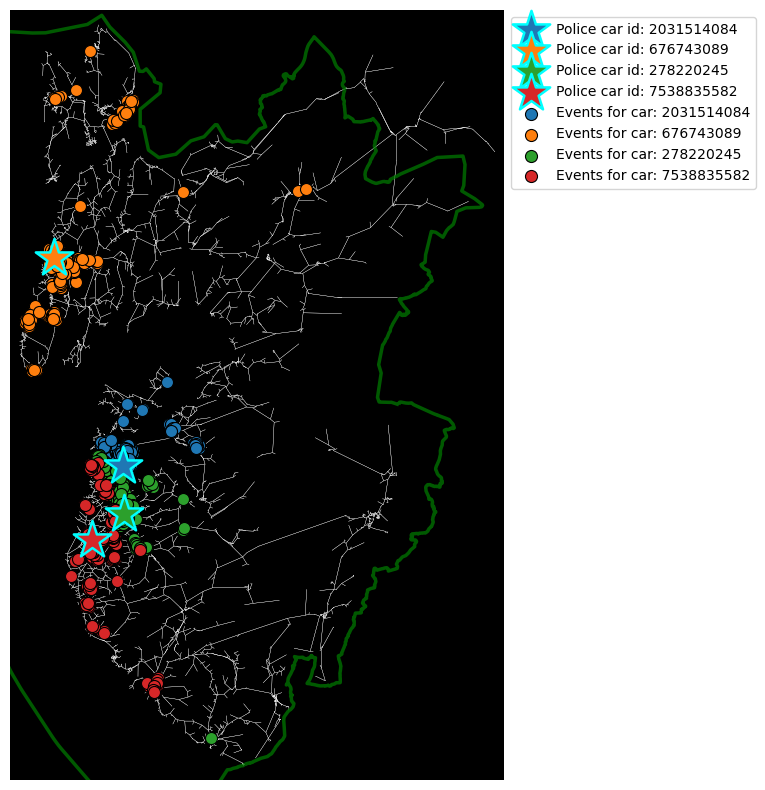

CPU times: total: 7.89 s
Wall time: 9.42 s


In [51]:
%%time
correction_factor = simulated_events_dict["correction_factor"]
utilityModule.plot_optimal_allocations(SouthWest_graph, SouthWest_polygon_gdf, optimal_locations_gdf, car_to_events_df, 
                car_nodes_gdf_filtered, nr_of_unique_events, NR_OF_CARS, CAR_CAPACITY, problem, correction_factor)

## 6.2 Visualize Isochrones - How far can you drive in different time intervals?
How far can you drive in 1.5, 4 and 8 minutes from the origin nodes? We'll use NetworkX to induce a subgraph of gruner_graph within each distance, based on travel time.  
We also, plot isochrones as buffers to get more faithful isochrones than convex hulls can offer.

In [104]:
# Define how many trip times to visualize
TRIP_TIMES = [15, 40, 100]  # in minutes
ISO_COLORS = ['blue', 'magenta', 'yellow']  # Long, Middle, Short ranges

Isochrone polygons for the travel times: [15, 40, 100] minutes


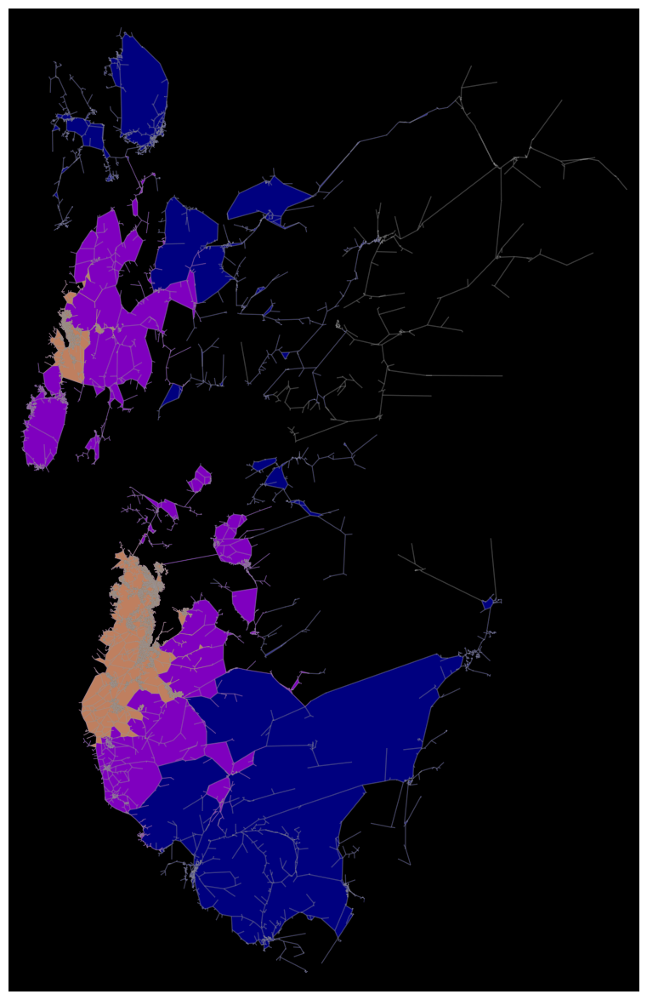

CPU times: total: 3min 7s
Wall time: 3min 27s


In [105]:
%%time
# Generate isochrone polygons
isochrone_polys = utilityModule.make_iso_polys(SouthWest_graph, TRIP_TIMES, carNodeID_list, 
                                                edge_buff=30, node_buff=0, infill=True)

# Merge isochrones
merged_isochrones = utilityModule.merge_isochrones(SouthWest_graph, isochrone_polys)

# Plotting the graph and merged isochrones
fig, ax = ox.plot_graph(SouthWest_graph, show=False, close=False, edge_color='#999999', edge_alpha=0.2, node_size=0, bgcolor='k', figsize=(15, 15))

# Plotting merged isochrones with colors
# iso_colors = ['blue', 'magenta', 'yellow']  # Long, Middle, Short ranges
for merged_poly, color in zip([merged_isochrones[0], merged_isochrones[1], merged_isochrones[2]], ISO_COLORS):
    if isinstance(merged_poly, MultiPolygon):
        for poly in merged_poly.geoms:
            patch = PolygonPatch(poly, fc=color, ec='none', alpha=0.5, zorder=-1)
            ax.add_patch(patch)
    else:
        patch = PolygonPatch(merged_poly, fc=color, ec='none', alpha=0.5, zorder=-1)
        ax.add_patch(patch)

print("Isochrone polygons for the travel times:", TRIP_TIMES, "minutes")
plt.show()

In [106]:
%%time
# Plot leaflet map
graph_map = utilityModule.plot_leaflet_map(SouthWest_graph, TRIP_TIMES, merged_isochrones, SouthWest_polygon_gdf, background_poly=True)
graph_map

CPU times: total: 5.22 s
Wall time: 6.01 s
